In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import geopandas as gpd
import plotly.express as px
import plotly.figure_factory as ff
import plotly.graph_objects as go
from scipy import stats
import statsmodels.api as sm
import statsmodels.formula.api as smf
from statsmodels.stats import diagnostic
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.linear_model import LinearRegression, Ridge, SGDRegressor
from sklearn.model_selection import cross_validate

In [2]:
pd.options.display.max_columns = None

#### Load data

In [3]:
PATH = './data_tesco/'

GROCERY_WARD = 'year_osward_grocery.csv'
GROCERY_BOROUGH = 'year_borough_grocery.csv'

DIABETES_WARD = 'diabetes_estimates_osward_2016.csv'
OBESITY_BOROUGH = 'london_obesity_borough_2012.csv'
#OBESITY_HOSP_BOROUGH = 'obesity_hospitalization_borough_2016.csv'
#CHILD_OBESITY_WARD = 'child_obesity_london_ward_2013-2014.csv'

MAPPING_BOROUGH_WARD = 'Mapping-template-london-ward-map-2018.xls'
MAPPING_CODE_BOROUGH = 'Mapping-template-for-London-boroughs.xls'

BOUNDARIES_BOROUGH = 'statistical-gis-boundaries-london/ESRI/London_Borough_Excluding_MHW.shp'

Load groceries in boroughs and wards

In [4]:
groceries_borough = pd.read_csv(PATH + GROCERY_BOROUGH, sep = ',', header = 0)
groceries_ward = pd.read_csv(PATH + GROCERY_WARD, sep = ',', header = 0)
# Consider representativeness?
groceries_borough = groceries_borough[groceries_borough['representativeness_norm'] >= 0.1]
groceries_ward = groceries_ward[groceries_ward['representativeness_norm'] >= 0.1]

Load ward to borough mapping

In [5]:
mapping_ward_to_borough = pd.read_excel(MAPPING_BOROUGH_WARD, sheet_name = 'Ward Thematic Map',usecols = [0, 1, 2],
                                        names = ['Ward Code', 'Ward name', 'Borough name'])
mapping_code_to_borough = pd.read_excel(MAPPING_CODE_BOROUGH, sheet_name = 'Borough Thematic Map',usecols = [1, 2],
                                       names = ['Borough Code', 'Borough name'])
mapping_ward_to_borough = mapping_ward_to_borough.merge(mapping_code_to_borough, on = 'Borough name')
mapping_ward_to_borough = mapping_ward_to_borough.drop(columns = ['Ward name', 'Borough name'])

Load health data

Some of the data (diabetes) are only available for borough, thus we average all wards part of a same borough and map the data to the corresponding borough.

In [6]:
# Diabetes
diabetes_ward = pd.read_csv(PATH + DIABETES_WARD, sep = ',', header = 0)
diabetes_ward = diabetes_ward.merge(mapping_ward_to_borough, left_on = 'area_id', right_on = 'Ward Code')
diabetes_ward = diabetes_ward.drop(columns = ['Ward Code'])
diabetes_borough = diabetes_ward.groupby(['Borough Code'], as_index = False).mean()
len(diabetes_borough)

28

In [7]:
# Obesity
obesity_borough = pd.read_csv(PATH + OBESITY_BOROUGH, sep = ',', header = 0)
len(obesity_borough)

33

Merge data for wards

In [8]:
merged_ward = pd.merge(diabetes_ward, groceries_ward, how = 'inner', left_index = False, on='area_id')
merged_ward.head()

,area_id,gp_patients,gp_patients_diabetes,estimated_diabetes_prevalence,Borough Code,weight,weight_perc2.5,weight_perc25,weight_perc50,weight_perc75,weight_perc97.5,weight_std,weight_ci95,volume,volume_perc2.5,volume_perc25,volume_perc50,volume_perc75,volume_perc97.5,volume_std,volume_ci95,fat,fat_perc2.5,fat_perc25,fat_perc50,fat_perc75,fat_perc97.5,fat_std,fat_ci95,saturate,saturate_perc2.5,saturate_perc25,saturate_perc50,saturate_perc75,saturate_perc97.5,saturate_std,saturate_ci95,salt,salt_perc2.5,salt_perc25,salt_perc50,salt_perc75,salt_perc97.5,salt_std,salt_ci95,sugar,sugar_perc2.5,sugar_perc25,sugar_perc50,sugar_perc75,sugar_perc97.5,sugar_std,sugar_ci95,protein,protein_perc2.5,protein_perc25,protein_perc50,protein_perc75,protein_perc97.5,protein_std,protein_ci95,carb,carb_perc2.5,carb_perc25,carb_perc50,carb_perc75,carb_perc97.5,carb_std,carb_ci95,fibre,fibre_perc2.5,fibre_perc25,fibre_perc50,fibre_perc75,fibre_perc97.5,fibre_std,fibre_ci95,alcohol,alcohol_perc2.5,alcohol_perc25,alcohol_perc50,alcohol_perc75,alcohol_perc97.5,alcohol_std,alcohol_ci95,energy_fat,energy_fat_perc2.5,energy_fat_perc25,energy_fat_perc50,energy_fat_perc75,energy_fat_perc97.5,energy_fat_std,energy_fat_ci95,energy_saturate,energy_saturate_perc2.5,energy_saturate_perc25,energy_saturate_perc50,energy_saturate_perc75,energy_saturate_perc97.5,energy_saturate_std,energy_saturate_ci95,energy_sugar,energy_sugar_perc2.5,energy_sugar_perc25,energy_sugar_perc50,energy_sugar_perc75,energy_sugar_perc97.5,energy_sugar_std,energy_sugar_ci95,energy_protein,energy_protein_perc2.5,energy_protein_perc25,energy_protein_perc50,energy_protein_perc75,energy_protein_perc97.5,energy_protein_std,energy_protein_ci95,energy_carb,energy_carb_perc2.5,energy_carb_perc25,energy_carb_perc50,energy_carb_perc75,energy_carb_perc97.5,energy_carb_std,energy_carb_ci95,energy_fibre,energy_fibre_perc2.5,energy_fibre_perc25,energy_fibre_perc50,energy_fibre_perc75,energy_fibre_perc97.5,energy_fibre_std,energy_fibre_ci95,energy_alcohol,energy_alcohol_perc2.5,energy_alcohol_perc25,energy_alcohol_perc50,energy_alcohol_perc75,energy_alcohol_perc97.5,energy_alcohol_std,energy_alcohol_ci95,energy_tot,energy_tot_perc2.5,energy_tot_perc25,energy_tot_perc50,energy_tot_perc75,energy_tot_perc97.5,energy_tot_std,energy_tot_ci95,f_energy_fat,f_energy_saturate,f_energy_sugar,f_energy_protein,f_energy_carb,f_energy_fibre,f_energy_alcohol,energy_density,h_nutrients_weight,h_nutrients_weight_norm,h_nutrients_calories,h_nutrients_calories_norm,f_beer,f_dairy,f_eggs,f_fats_oils,f_fish,f_fruit_veg,f_grains,f_meat_red,f_poultry,f_readymade,f_sauces,f_soft_drinks,f_spirits,f_sweets,f_tea_coffee,f_water,f_wine,f_dairy_weight,f_eggs_weight,f_fats_oils_weight,f_fish_weight,f_fruit_veg_weight,f_grains_weight,f_meat_red_weight,f_poultry_weight,f_readymade_weight,f_sauces_weight,f_sweets_weight,h_items,h_items_norm,h_items_weight,h_items_weight_norm,representativeness_norm,transaction_days,num_transactions,man_day,population,male,female,age_0_17,age_18_64,age_65+,avg_age,area_sq_km,people_per_sq_km
0,E05000026,13136,1068,8.1,E09000002,449.535137,32.5,166.4,300.0,500.0,1500.0,771.349423,3.716832,125.960833,11.00,45.000,90.0,200.0,340.8,114.892118,1.127239,9.488797,0.0,0.2,2.4,14.1,50.5,15.119655,0.057529,3.693721,0.0,0.1,0.8,4.3,21.0,6.714925,0.025550,0.583240,0.0,0.01,0.20,0.80,2.4,2.239420,0.008521,10.966213,0.0,1.4,4.4,11.8,58.5,16.636405,0.063300,4.977560,0.0,0.4,2.8,7.6,23.4,6.156284,0.023424,19.381951,0.0,0.3,8.2,32.2,73.5,23.859315,0.090782,1.564721,0.0,0.0,1.0,2.2,7.3,2.323645,0.008841,0.198172,0.0,0.0,0.0,0.0,0.0,1.692997,0.006442,85.399176,0.0,1.8,21.6,126.9,454.5,136.076899,0.517759,33.243489,0.0,0.9,7.2,38.7,189.0,60.434321,0.229946,43.864852,0.0,5.6,17.6,47.2,234.0,66.545619,0.253199,19.910240,0.0,1.6,11.2,30.4,93.6,24.625135,0.093696,77.527804,0.0,1.2,32.8,128.8,294.0,95.437261,0.363129,2.890336,0.0,0.0,1.6,4.4,14.4,4.436731,0.016881,1.387201,0.0,0.0,0.0,0.0,0.0,11.850977,0.045092,187.114757,0.0,41.

Merge data for boroughs

In [9]:
merged = pd.merge(groceries_borough, obesity_borough, how = 'inner', left_index = False, left_on='area_id',
                         right_on = 'oslaua')
merged_borough = pd.merge(merged, diabetes_borough, how = 'inner', left_index = False, left_on='area_id',
                         right_on = 'Borough Code')
len(merged_borough)
merged_borough.head()

,area_id,weight,weight_perc2.5,weight_perc25,weight_perc50,weight_perc75,weight_perc97.5,weight_std,weight_ci95,volume,volume_perc2.5,volume_perc25,volume_perc50,volume_perc75,volume_perc97.5,volume_std,volume_ci95,fat,fat_perc2.5,fat_perc25,fat_perc50,fat_perc75,fat_perc97.5,fat_std,fat_ci95,saturate,saturate_perc2.5,saturate_perc25,saturate_perc50,saturate_perc75,saturate_perc97.5,saturate_std,saturate_ci95,salt,salt_perc2.5,salt_perc25,salt_perc50,salt_perc75,salt_perc97.5,salt_std,salt_ci95,sugar,sugar_perc2.5,sugar_perc25,sugar_perc50,sugar_perc75,sugar_perc97.5,sugar_std,sugar_ci95,protein,protein_perc2.5,protein_perc25,protein_perc50,protein_perc75,protein_perc97.5,protein_std,protein_ci95,carb,carb_perc2.5,carb_perc25,carb_perc50,carb_perc75,carb_perc97.5,carb_std,carb_ci95,fibre,fibre_perc2.5,fibre_perc25,fibre_perc50,fibre_perc75,fibre_perc97.5,fibre_std,fibre_ci95,alcohol,alcohol_perc2.5,alcohol_perc25,alcohol_perc50,alcohol_perc75,alcohol_perc97.5,alcohol_std,alcohol_ci95,energy_fat,energy_fat_perc2.5,energy_fat_perc25,energy_fat_perc50,energy_fat_perc75,energy_fat_perc97.5,energy_fat_std,energy_fat_ci95,energy_saturate,energy_saturate_perc2.5,energy_saturate_perc25,energy_saturate_perc50,energy_saturate_perc75,energy_saturate_perc97.5,energy_saturate_std,energy_saturate_ci95,energy_sugar,energy_sugar_perc2.5,energy_sugar_perc25,energy_sugar_perc50,energy_sugar_perc75,energy_sugar_perc97.5,energy_sugar_std,energy_sugar_ci95,energy_protein,energy_protein_perc2.5,energy_protein_perc25,energy_protein_perc50,energy_protein_perc75,energy_protein_perc97.5,energy_protein_std,energy_protein_ci95,energy_carb,energy_carb_perc2.5,energy_carb_perc25,energy_carb_perc50,energy_carb_perc75,energy_carb_perc97.5,energy_carb_std,energy_carb_ci95,energy_fibre,energy_fibre_perc2.5,energy_fibre_perc25,energy_fibre_perc50,energy_fibre_perc75,energy_fibre_perc97.5,energy_fibre_std,energy_fibre_ci95,energy_alcohol,energy_alcohol_perc2.5,energy_alcohol_perc25,energy_alcohol_perc50,energy_alcohol_perc75,energy_alcohol_perc97.5,energy_alcohol_std,energy_alcohol_ci95,energy_tot,energy_tot_perc2.5,energy_tot_perc25,energy_tot_perc50,energy_tot_perc75,energy_tot_perc97.5,energy_tot_std,energy_tot_ci95,f_energy_fat,f_energy_saturate,f_energy_sugar,f_energy_protein,f_energy_carb,f_energy_fibre,f_energy_alcohol,energy_density,h_nutrients_weight,h_nutrients_weight_norm,h_nutrients_calories,h_nutrients_calories_norm,f_beer,f_dairy,f_eggs,f_fats_oils,f_fish,f_fruit_veg,f_grains,f_meat_red,f_poultry,f_readymade,f_sauces,f_soft_drinks,f_spirits,f_sweets,f_tea_coffee,f_water,f_wine,f_dairy_weight,f_eggs_weight,f_fats_oils_weight,f_fish_weight,f_fruit_veg_weight,f_grains_weight,f_meat_red_weight,f_poultry_weight,f_readymade_weight,f_sauces_weight,f_sweets_weight,h_items,h_items_norm,h_items_weight,h_items_weight_norm,representativeness_norm,transaction_days,num_transactions,man_day,population,male,female,age_0_17,age_18_64,age_65+,avg_age,area_sq_km,people_per_sq_km,oslaua,f_healthy_weight,f_overweight,f_obese,weighted_sample,Borough Code,gp_patients,gp_patients_diabetes,estimated_diabetes_prevalence
0,E09000002,421.304125,32.5,165.6,300.0,500.0,1500.0,597.994271,0.828993,122.341294,11.0,47.1,90.0,175.0,340.8,115.859833,0.351870,9.209959,0.0,0.2,2.4,13.9,48.2,14.478662,0.016131,3.596834,0.0,0.1,0.8,4.1,20.5,6.466539,0.007205,0.603081,0.0,0.03,0.20,0.80,2.4,2.168270,0.002416,10.793244,0.0,1.3,4.1,11.8,58.5,16.635331,0.018534,5.193872,0.0,0.4,3.0,7.9,23.5,6.274192,0.006990,19.784988,0.0,0.4,8.7,33.6,75.3,24.192629,0.026954,1.590335,0.0,0.0,1.0,2.2,7.5,2.451484,0.002731,0.202540,0.0,0.0,0.0,0.0,0.00,1.767156,0.001969,82.889630,0.0,1.8,21.6,125.1,433.8,130.307956,0.145182,32.371503,0.0,0.9,7.2,36.9,184.5,58.198855,0.064842,43.172978,0.0,5.2,16.4,47.2,234.0,66.541322,0.074136,20.775486,0.0,1.6,12.0,31.6,94.0,25.096766,0.027961,79.139950,0.0,1.6,34.8,134.4,301.2,96.770514,0.107816,2.951541,0.0,0.0,1.6,4.4,14.4,4.737520,0.005278,1.417782,0.0,0.0,0.0,0.0,0.00,12

Load and merge boundaries

In [10]:
map_borough = gpd.read_file(BOUNDARIES_BOROUGH)
merged = map_borough.merge(merged_borough, left_on = 'GSS_CODE', right_on = 'area_id', how = 'inner')

#### Plot function

In [11]:
def plot_london(variable, merged_borough):
    MAPBOX_ACCESSTOKEN = 'pk.eyJ1Ijoic29zbzk0IiwiYSI6ImNraTdwem80MDFsNXEyc3FzeGMxOHpoZGkifQ.coIFQU-pN6pZJi0GuXnLVw'
    merged = map_borough.merge(merged_borough, left_on = 'GSS_CODE', right_on = 'area_id', how = 'inner')
    merged = merged.to_crs(epsg=4326) # convert the coordinate reference system to lat/long
    lga_json = merged.__geo_interface__ #covert to geoJSON
    zmin = merged[variable].min()
    zmax = merged[variable].max()
    name = merged['NAME']

    # Set the data for the map
    data = go.Choroplethmapbox(
            geojson = lga_json,             #this is your GeoJSON
            locations = merged.index,    #the index of this dataframe should align with the 'id' element in your geojson
            z = merged[variable], #sets the color value
            text = merged.NAME,    #sets text for each shape
            colorbar=dict(thickness=20, ticklen=3, tickformat='',outlinewidth=0), #adjusts the format of the colorbar
            marker_line_width=1, marker_opacity=0.7, colorscale="Viridis", #adjust format of the plot
            zmin=zmin, zmax=zmax,           #sets min and max of the colorbar
            hovertemplate = "<b>%{text}</b><br>" +
                        "%{z:.0%}<br>" +
                        "<extra></extra>")  # sets the format of the text shown when you hover over each shape

    # Set the layout for the map
    layout = go.Layout(
        title = {'text': variable,
                'font': {'size':24}},       #format the plot title
        mapbox1 = dict(
            domain = {'x': [0, 1],'y': [0, 1]}, 
            center = dict(lat=51.509865 , lon=-0.118092),
            accesstoken = MAPBOX_ACCESSTOKEN, 
            zoom = 8),                      
        autosize=True,
        height=650,
        margin=dict(l=0, r=0, t=40, b=0))

    # Generate the map
    fig=go.Figure(data=data, layout=layout)
    fig.show()

### Are the areas with most diabetes are the same as areas with obesity?

Check if there's a correlation between the indicators

In [12]:
indicators = ['estimated_diabetes_prevalence', 'f_obese']
df = merged_borough[indicators]
df.corr(method='spearman')

,estimated_diabetes_prevalence,f_obese
estimated_diabetes_prevalence,1.000000,0.621067
f_obese,0.621067,1.000000


Check if those indicators are correlated with any food habits

In [13]:
# We partition 'types' of food habits
energy_nutrients = ['energy_tot', 'energy_fat', 'energy_saturate', 'energy_sugar', 'energy_protein', 'energy_carb', 'energy_fibre',
            'energy_alcohol', 'h_nutrients_calories']
f_food_categories = ['f_beer', 'f_dairy', 'f_eggs', 'f_fats_oils', 'f_fish', 'f_fruit_veg', 'f_grains',
                   'f_meat_red', 'f_poultry', 'f_readymade', 'f_sauces', 'f_soft_drinks', 'f_spirits',
                   'f_sweets', 'f_tea_coffee', 'f_water', 'f_wine']
features = energy_nutrients + f_food_categories

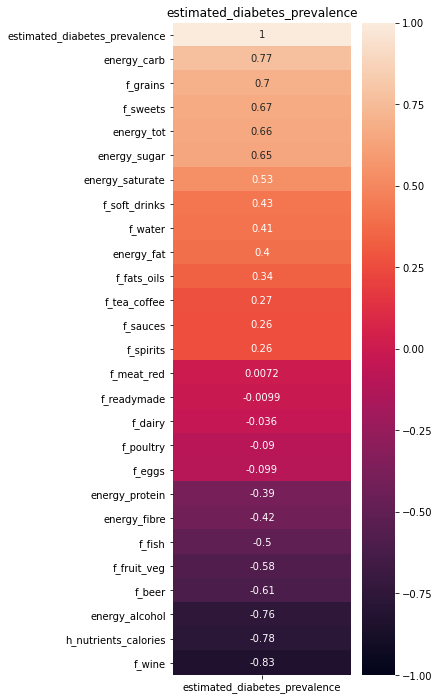

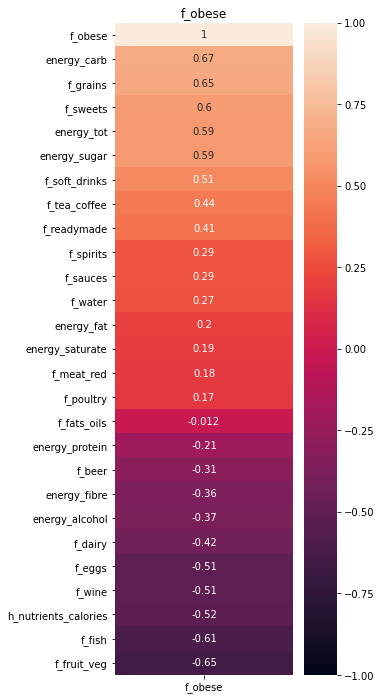

In [14]:
for ind in indicators :
    plt.figure(figsize=(4, 12))
    labels = features.copy()
    labels.append(ind)
    #print(labels)
    df = merged_borough[labels]
    #mask = np.triu(np.ones_like(df.corr(), dtype=np.bool))
    #print(merged_borough)
    #print(df.corr()[ind].sort_values(ascending=False).shape)
    #data = np.asarray(df.corr()[ind].sort_values(ascending=False)).reshape(8,1)
    heatmap = sns.heatmap(df.corr(method='spearman')[[ind]].sort_values(by = ind, ascending=False), vmin=-1, vmax=1, annot=True)
    heatmap.set_title(ind, fontdict={'fontsize':12})
    
    plt.show()

#### Visualize average diet

Plot nutrient and category repartition in average diet

In [15]:
average_nutrients = pd.DataFrame(groceries_ward.mean(axis = 0)[energy_nutrients], columns = ['nutrient'])
average_categories = pd.DataFrame(groceries_ward.mean(axis = 0)[f_food_categories], columns = ['category'])

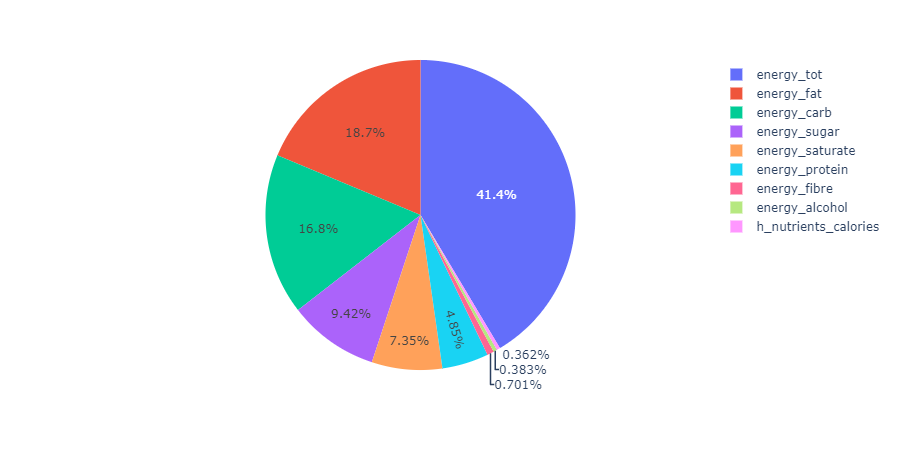

In [16]:
fig = px.pie(data_frame = average_nutrients, values = 'nutrient', names = average_nutrients.index)
fig.show()

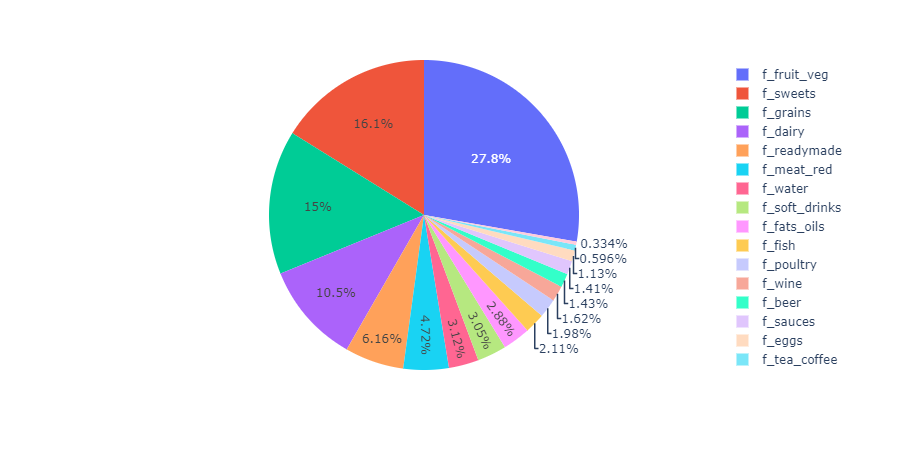

In [17]:
fig = px.pie(data_frame = average_categories, values = 'category', names = average_categories.index)
fig.show()

### Compute diet score

#### Method 1 : fit a linear regression on the diabetes prevalence with the highest correlated energy_nutrients features

In [18]:
correlation = pd.DataFrame(columns = ['feature', 'R', 'p_value'])
for f in energy_nutrients:
    corr = stats.spearmanr(merged_ward['estimated_diabetes_prevalence'],merged_ward[f])
    corr_data = pd.DataFrame([[f, corr[0], corr[1]]], columns = ['feature', 'R', 'p_value'])
    correlation = correlation.append(corr_data, ignore_index = True)
sig_features = correlation[correlation['p_value'] < 1e-3]
sig_features

,feature,R,p_value
0,energy_tot,0.581322,7.111477e-49
1,energy_fat,0.349559,1.457173e-16
2,energy_saturate,0.338317,1.497394e-15
3,energy_sugar,0.537692,9.579626e-41
4,energy_protein,-0.483767,3.297321e-32
5,energy_carb,0.685444,3.170493e-74
6,energy_fibre,-0.494983,7.341391e-34
7,energy_alcohol,-0.573202,2.869457e-47
8,h_nutrients_calories,-0.776294,4.364330e-107


In [19]:
features = ['energy_tot', 'energy_carb', 'energy_alcohol', 'h_nutrients_calories']

In [20]:
def find_weights(merged, label):
    X = merged[features]
    y = merged[label]
    scaler = StandardScaler()
    X = scaler.fit_transform(X)
    hyperparams = {'reg':[0.1, 0.01, 0.001, 0.0001], 'learning_rate':[0.1, 0.05, 0.01]}
    scenarios = []
    for lr in hyperparams['learning_rate']:
        for r in hyperparams['reg']:
            scores = cross_validate(SGDRegressor(alpha = r, eta0 = lr),X, y = y, cv = 3,
                             scoring=('explained_variance', 'neg_mean_squared_error', 'r2'))
            scenario = {'learning_rate':lr, 'regularizer':r,
                        'MSE': scores['test_neg_mean_squared_error'],
                        'Explained variance': scores['test_explained_variance'],
                       'r2' : scores['test_r2']}
            #print(scores)
            scenarios.append(scenario)

    best = np.argmax([np.mean(s['r2']) for s in scenarios])

    reg_opt = scenarios[best]['regularizer']
    lr_opt = scenarios[best]['learning_rate']
    print(reg_opt, lr_opt)
    model_opt = SGDRegressor(eta0 = lr_opt, alpha = reg_opt)
    model_opt.fit(X,y)
    r2 = model_opt.score(X, y)
    train_error = np.mean((model_opt.predict(X)-y)**2)
    print(label)
    print(("Training error : {}, R2 : {}").
          format(train_error, r2))
    return model_opt.coef_

In [21]:
weights = find_weights(merged_borough, 'estimated_diabetes_prevalence')

0.1 0.01
estimated_diabetes_prevalence
Training error : 0.825554826417142, R2 : 0.6303946573366022


In [22]:
def score(area):
    df = area[features].values
    score = (df*weights).sum()
    return score

In [23]:
merged_borough['score1'] = merged_borough.apply(score, axis=1)
scaler = MinMaxScaler()
merged_borough['score1'] = scaler.fit_transform(merged_borough[['score1']].values.reshape(-1,1))

Check consistency : plot repartition of lowest and highest scoring area

In [24]:
lowest = pd.DataFrame(merged_borough[merged_borough['score1'] <= merged_borough['score1'].quantile(0.25)][features]).T
highest = pd.DataFrame(merged_borough[merged_borough['score1'] >= merged_borough['score1'].quantile(0.75)][features]).T
highest

,0,2,3,6,12,20,22
energy_tot,187.174390,180.510586,184.657955,180.734665,190.274533,185.425645,180.548079
energy_carb,79.139950,74.905905,76.702113,74.270255,81.002080,77.116880,74.024918
energy_alcohol,1.417782,1.447296,1.913442,1.579152,1.407339,1.281967,1.395230
h_nutrients_calories,1.545272,1.555736,1.567786,1.573451,1.551112,1.531496,1.560387


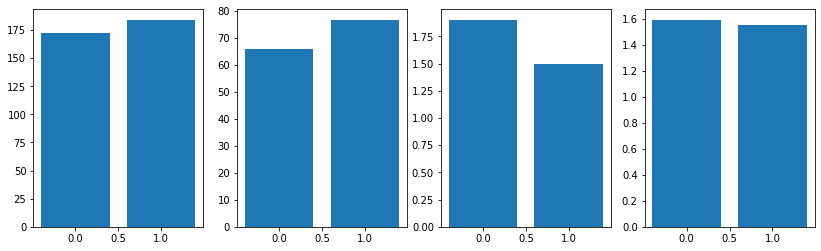

In [25]:
fig, axs = plt.subplots(nrows=1, ncols=4, sharex=False, sharey=False, figsize=(14, 4))

for i, f in enumerate(features):
    axs[i].bar([0, 1], [lowest.loc[f].mean(), highest.loc[f].mean()])

#### Method 2 : fit a linear regression on the diabetes prevalence with the most consumed f_food_categories features

In [58]:
features = ['f_fruit_veg', 'f_sweets', 'f_grains', 'f_dairy']

In [59]:
weights = find_weights(merged_borough, 'estimated_diabetes_prevalence')

0.1 0.05
estimated_diabetes_prevalence
Training error : 1.0321854915990485, R2 : 0.5378849955122345


In [60]:
merged_borough['score2'] = merged_borough.apply(score, axis=1)
scaler = MinMaxScaler()
merged_borough['score2'] = scaler.fit_transform(merged_borough[['score2']].values.reshape(-1,1))

Problem : Optimal hyperparameters keep changing through runs. Maybe due to small data?
Also, for now we select best hyper-param according to r2 score. should maybe change?

In [61]:
lowest = pd.DataFrame(merged_borough[merged_borough['score2'] <= merged_borough['score2'].quantile(0.25)][features]).T
highest = pd.DataFrame(merged_borough[merged_borough['score2'] >= merged_borough['score2'].quantile(0.75)][features]).T
highest

,0,2,3,6,7,12,20
f_fruit_veg,0.248116,0.270670,0.247085,0.265979,0.265657,0.240151,0.254554
f_sweets,0.179794,0.161408,0.179765,0.160056,0.151163,0.188978,0.177719
f_grains,0.157618,0.157685,0.164548,0.146914,0.151306,0.174518,0.154189
f_dairy,0.096583,0.115018,0.096956,0.105186,0.103941,0.087824,0.114938


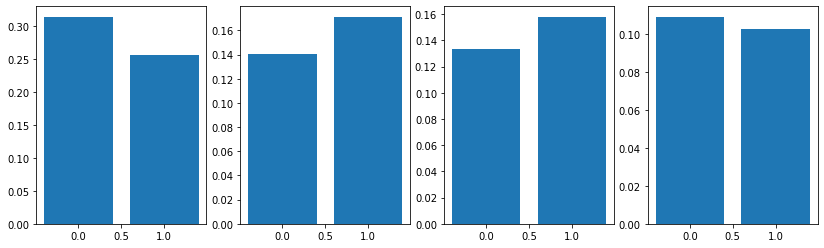

In [62]:
fig, axs = plt.subplots(nrows=1, ncols=4, sharex=False, sharey=False, figsize=(14, 4))

for i, f in enumerate(features):
    axs[i].bar([0, 1], [lowest.loc[f].mean(), highest.loc[f].mean()])

#### Method 3: compute a score based on OMS recommendations

We compute 5 criterias that make a diet healthy and that are either 0 or 1 depending on if they are fulfilled or not: fat criteria (< 30% of total energy intake), saturated fat criteria (< 10% of total energy intake), sugars criteria (< 10% of total energy intake), etc... We obtain a final score between 0 and 5, out of 5.

In [63]:
merged_borough['score3'] = 0
merged_borough.head()

,area_id,weight,weight_perc2.5,weight_perc25,weight_perc50,weight_perc75,weight_perc97.5,weight_std,weight_ci95,volume,volume_perc2.5,volume_perc25,volume_perc50,volume_perc75,volume_perc97.5,volume_std,volume_ci95,fat,fat_perc2.5,fat_perc25,fat_perc50,fat_perc75,fat_perc97.5,fat_std,fat_ci95,saturate,saturate_perc2.5,saturate_perc25,saturate_perc50,saturate_perc75,saturate_perc97.5,saturate_std,saturate_ci95,salt,salt_perc2.5,salt_perc25,salt_perc50,salt_perc75,salt_perc97.5,salt_std,salt_ci95,sugar,sugar_perc2.5,sugar_perc25,sugar_perc50,sugar_perc75,sugar_perc97.5,sugar_std,sugar_ci95,protein,protein_perc2.5,protein_perc25,protein_perc50,protein_perc75,protein_perc97.5,protein_std,protein_ci95,carb,carb_perc2.5,carb_perc25,carb_perc50,carb_perc75,carb_perc97.5,carb_std,carb_ci95,fibre,fibre_perc2.5,fibre_perc25,fibre_perc50,fibre_perc75,fibre_perc97.5,fibre_std,fibre_ci95,alcohol,alcohol_perc2.5,alcohol_perc25,alcohol_perc50,alcohol_perc75,alcohol_perc97.5,alcohol_std,alcohol_ci95,energy_fat,energy_fat_perc2.5,energy_fat_perc25,energy_fat_perc50,energy_fat_perc75,energy_fat_perc97.5,energy_fat_std,energy_fat_ci95,energy_saturate,energy_saturate_perc2.5,energy_saturate_perc25,energy_saturate_perc50,energy_saturate_perc75,energy_saturate_perc97.5,energy_saturate_std,energy_saturate_ci95,energy_sugar,energy_sugar_perc2.5,energy_sugar_perc25,energy_sugar_perc50,energy_sugar_perc75,energy_sugar_perc97.5,energy_sugar_std,energy_sugar_ci95,energy_protein,energy_protein_perc2.5,energy_protein_perc25,energy_protein_perc50,energy_protein_perc75,energy_protein_perc97.5,energy_protein_std,energy_protein_ci95,energy_carb,energy_carb_perc2.5,energy_carb_perc25,energy_carb_perc50,energy_carb_perc75,energy_carb_perc97.5,energy_carb_std,energy_carb_ci95,energy_fibre,energy_fibre_perc2.5,energy_fibre_perc25,energy_fibre_perc50,energy_fibre_perc75,energy_fibre_perc97.5,energy_fibre_std,energy_fibre_ci95,energy_alcohol,energy_alcohol_perc2.5,energy_alcohol_perc25,energy_alcohol_perc50,energy_alcohol_perc75,energy_alcohol_perc97.5,energy_alcohol_std,energy_alcohol_ci95,energy_tot,energy_tot_perc2.5,energy_tot_perc25,energy_tot_perc50,energy_tot_perc75,energy_tot_perc97.5,energy_tot_std,energy_tot_ci95,f_energy_fat,f_energy_saturate,f_energy_sugar,f_energy_protein,f_energy_carb,f_energy_fibre,f_energy_alcohol,energy_density,h_nutrients_weight,h_nutrients_weight_norm,h_nutrients_calories,h_nutrients_calories_norm,f_beer,f_dairy,f_eggs,f_fats_oils,f_fish,f_fruit_veg,f_grains,f_meat_red,f_poultry,f_readymade,f_sauces,f_soft_drinks,f_spirits,f_sweets,f_tea_coffee,f_water,f_wine,f_dairy_weight,f_eggs_weight,f_fats_oils_weight,f_fish_weight,f_fruit_veg_weight,f_grains_weight,f_meat_red_weight,f_poultry_weight,f_readymade_weight,f_sauces_weight,f_sweets_weight,h_items,h_items_norm,h_items_weight,h_items_weight_norm,representativeness_norm,transaction_days,num_transactions,man_day,population,male,female,age_0_17,age_18_64,age_65+,avg_age,area_sq_km,people_per_sq_km,oslaua,f_healthy_weight,f_overweight,f_obese,weighted_sample,Borough Code,gp_patients,gp_patients_diabetes,estimated_diabetes_prevalence,score1,score2,score3
0,E09000002,421.304125,32.5,165.6,300.0,500.0,1500.0,597.994271,0.828993,122.341294,11.0,47.1,90.0,175.0,340.8,115.859833,0.351870,9.209959,0.0,0.2,2.4,13.9,48.2,14.478662,0.016131,3.596834,0.0,0.1,0.8,4.1,20.5,6.466539,0.007205,0.603081,0.0,0.03,0.20,0.80,2.4,2.168270,0.002416,10.793244,0.0,1.3,4.1,11.8,58.5,16.635331,0.018534,5.193872,0.0,0.4,3.0,7.9,23.5,6.274192,0.006990,19.784988,0.0,0.4,8.7,33.6,75.3,24.192629,0.026954,1.590335,0.0,0.0,1.0,2.2,7.5,2.451484,0.002731,0.202540,0.0,0.0,0.0,0.0,0.00,1.767156,0.001969,82.889630,0.0,1.8,21.6,125.1,433.8,130.307956,0.145182,32.371503,0.0,0.9,7.2,36.9,184.5,58.198855,0.064842,43.172978,0.0,5.2,16.4,47.2,234.0,66.541322,0.074136,20.775486,0.0,1.6,12.0,31.6,94.0,25.096766,0.027961,79.139950,0.0,1.6,34.8,134.4,301.2,96.770514,0.107816,2.951541,0.0,0.0,1.6,4.4,14.4,4.737520,0.005278,1.417782,0.

In [64]:
# Total fat should not exceed 30% of total energy intake
merged_borough.loc[(merged_borough['energy_fat'] <= 0.3*merged_borough['energy_tot']), 'score3'] += 0.2
merged_borough.head()

,area_id,weight,weight_perc2.5,weight_perc25,weight_perc50,weight_perc75,weight_perc97.5,weight_std,weight_ci95,volume,volume_perc2.5,volume_perc25,volume_perc50,volume_perc75,volume_perc97.5,volume_std,volume_ci95,fat,fat_perc2.5,fat_perc25,fat_perc50,fat_perc75,fat_perc97.5,fat_std,fat_ci95,saturate,saturate_perc2.5,saturate_perc25,saturate_perc50,saturate_perc75,saturate_perc97.5,saturate_std,saturate_ci95,salt,salt_perc2.5,salt_perc25,salt_perc50,salt_perc75,salt_perc97.5,salt_std,salt_ci95,sugar,sugar_perc2.5,sugar_perc25,sugar_perc50,sugar_perc75,sugar_perc97.5,sugar_std,sugar_ci95,protein,protein_perc2.5,protein_perc25,protein_perc50,protein_perc75,protein_perc97.5,protein_std,protein_ci95,carb,carb_perc2.5,carb_perc25,carb_perc50,carb_perc75,carb_perc97.5,carb_std,carb_ci95,fibre,fibre_perc2.5,fibre_perc25,fibre_perc50,fibre_perc75,fibre_perc97.5,fibre_std,fibre_ci95,alcohol,alcohol_perc2.5,alcohol_perc25,alcohol_perc50,alcohol_perc75,alcohol_perc97.5,alcohol_std,alcohol_ci95,energy_fat,energy_fat_perc2.5,energy_fat_perc25,energy_fat_perc50,energy_fat_perc75,energy_fat_perc97.5,energy_fat_std,energy_fat_ci95,energy_saturate,energy_saturate_perc2.5,energy_saturate_perc25,energy_saturate_perc50,energy_saturate_perc75,energy_saturate_perc97.5,energy_saturate_std,energy_saturate_ci95,energy_sugar,energy_sugar_perc2.5,energy_sugar_perc25,energy_sugar_perc50,energy_sugar_perc75,energy_sugar_perc97.5,energy_sugar_std,energy_sugar_ci95,energy_protein,energy_protein_perc2.5,energy_protein_perc25,energy_protein_perc50,energy_protein_perc75,energy_protein_perc97.5,energy_protein_std,energy_protein_ci95,energy_carb,energy_carb_perc2.5,energy_carb_perc25,energy_carb_perc50,energy_carb_perc75,energy_carb_perc97.5,energy_carb_std,energy_carb_ci95,energy_fibre,energy_fibre_perc2.5,energy_fibre_perc25,energy_fibre_perc50,energy_fibre_perc75,energy_fibre_perc97.5,energy_fibre_std,energy_fibre_ci95,energy_alcohol,energy_alcohol_perc2.5,energy_alcohol_perc25,energy_alcohol_perc50,energy_alcohol_perc75,energy_alcohol_perc97.5,energy_alcohol_std,energy_alcohol_ci95,energy_tot,energy_tot_perc2.5,energy_tot_perc25,energy_tot_perc50,energy_tot_perc75,energy_tot_perc97.5,energy_tot_std,energy_tot_ci95,f_energy_fat,f_energy_saturate,f_energy_sugar,f_energy_protein,f_energy_carb,f_energy_fibre,f_energy_alcohol,energy_density,h_nutrients_weight,h_nutrients_weight_norm,h_nutrients_calories,h_nutrients_calories_norm,f_beer,f_dairy,f_eggs,f_fats_oils,f_fish,f_fruit_veg,f_grains,f_meat_red,f_poultry,f_readymade,f_sauces,f_soft_drinks,f_spirits,f_sweets,f_tea_coffee,f_water,f_wine,f_dairy_weight,f_eggs_weight,f_fats_oils_weight,f_fish_weight,f_fruit_veg_weight,f_grains_weight,f_meat_red_weight,f_poultry_weight,f_readymade_weight,f_sauces_weight,f_sweets_weight,h_items,h_items_norm,h_items_weight,h_items_weight_norm,representativeness_norm,transaction_days,num_transactions,man_day,population,male,female,age_0_17,age_18_64,age_65+,avg_age,area_sq_km,people_per_sq_km,oslaua,f_healthy_weight,f_overweight,f_obese,weighted_sample,Borough Code,gp_patients,gp_patients_diabetes,estimated_diabetes_prevalence,score1,score2,score3
0,E09000002,421.304125,32.5,165.6,300.0,500.0,1500.0,597.994271,0.828993,122.341294,11.0,47.1,90.0,175.0,340.8,115.859833,0.351870,9.209959,0.0,0.2,2.4,13.9,48.2,14.478662,0.016131,3.596834,0.0,0.1,0.8,4.1,20.5,6.466539,0.007205,0.603081,0.0,0.03,0.20,0.80,2.4,2.168270,0.002416,10.793244,0.0,1.3,4.1,11.8,58.5,16.635331,0.018534,5.193872,0.0,0.4,3.0,7.9,23.5,6.274192,0.006990,19.784988,0.0,0.4,8.7,33.6,75.3,24.192629,0.026954,1.590335,0.0,0.0,1.0,2.2,7.5,2.451484,0.002731,0.202540,0.0,0.0,0.0,0.0,0.00,1.767156,0.001969,82.889630,0.0,1.8,21.6,125.1,433.8,130.307956,0.145182,32.371503,0.0,0.9,7.2,36.9,184.5,58.198855,0.064842,43.172978,0.0,5.2,16.4,47.2,234.0,66.541322,0.074136,20.775486,0.0,1.6,12.0,31.6,94.0,25.096766,0.027961,79.139950,0.0,1.6,34.8,134.4,301.2,96.770514,0.107816,2.951541,0.0,0.0,1.6,4.4,14.4,4.737520,0.005278,1.417782,0.

In [65]:
# Intake of saturated fats should be less than 10% of total energy intake
merged_borough.loc[(merged_borough['energy_saturate'] <= 0.1*merged_borough['energy_tot']), 'score3'] += 0.2
merged_borough.head()

,area_id,weight,weight_perc2.5,weight_perc25,weight_perc50,weight_perc75,weight_perc97.5,weight_std,weight_ci95,volume,volume_perc2.5,volume_perc25,volume_perc50,volume_perc75,volume_perc97.5,volume_std,volume_ci95,fat,fat_perc2.5,fat_perc25,fat_perc50,fat_perc75,fat_perc97.5,fat_std,fat_ci95,saturate,saturate_perc2.5,saturate_perc25,saturate_perc50,saturate_perc75,saturate_perc97.5,saturate_std,saturate_ci95,salt,salt_perc2.5,salt_perc25,salt_perc50,salt_perc75,salt_perc97.5,salt_std,salt_ci95,sugar,sugar_perc2.5,sugar_perc25,sugar_perc50,sugar_perc75,sugar_perc97.5,sugar_std,sugar_ci95,protein,protein_perc2.5,protein_perc25,protein_perc50,protein_perc75,protein_perc97.5,protein_std,protein_ci95,carb,carb_perc2.5,carb_perc25,carb_perc50,carb_perc75,carb_perc97.5,carb_std,carb_ci95,fibre,fibre_perc2.5,fibre_perc25,fibre_perc50,fibre_perc75,fibre_perc97.5,fibre_std,fibre_ci95,alcohol,alcohol_perc2.5,alcohol_perc25,alcohol_perc50,alcohol_perc75,alcohol_perc97.5,alcohol_std,alcohol_ci95,energy_fat,energy_fat_perc2.5,energy_fat_perc25,energy_fat_perc50,energy_fat_perc75,energy_fat_perc97.5,energy_fat_std,energy_fat_ci95,energy_saturate,energy_saturate_perc2.5,energy_saturate_perc25,energy_saturate_perc50,energy_saturate_perc75,energy_saturate_perc97.5,energy_saturate_std,energy_saturate_ci95,energy_sugar,energy_sugar_perc2.5,energy_sugar_perc25,energy_sugar_perc50,energy_sugar_perc75,energy_sugar_perc97.5,energy_sugar_std,energy_sugar_ci95,energy_protein,energy_protein_perc2.5,energy_protein_perc25,energy_protein_perc50,energy_protein_perc75,energy_protein_perc97.5,energy_protein_std,energy_protein_ci95,energy_carb,energy_carb_perc2.5,energy_carb_perc25,energy_carb_perc50,energy_carb_perc75,energy_carb_perc97.5,energy_carb_std,energy_carb_ci95,energy_fibre,energy_fibre_perc2.5,energy_fibre_perc25,energy_fibre_perc50,energy_fibre_perc75,energy_fibre_perc97.5,energy_fibre_std,energy_fibre_ci95,energy_alcohol,energy_alcohol_perc2.5,energy_alcohol_perc25,energy_alcohol_perc50,energy_alcohol_perc75,energy_alcohol_perc97.5,energy_alcohol_std,energy_alcohol_ci95,energy_tot,energy_tot_perc2.5,energy_tot_perc25,energy_tot_perc50,energy_tot_perc75,energy_tot_perc97.5,energy_tot_std,energy_tot_ci95,f_energy_fat,f_energy_saturate,f_energy_sugar,f_energy_protein,f_energy_carb,f_energy_fibre,f_energy_alcohol,energy_density,h_nutrients_weight,h_nutrients_weight_norm,h_nutrients_calories,h_nutrients_calories_norm,f_beer,f_dairy,f_eggs,f_fats_oils,f_fish,f_fruit_veg,f_grains,f_meat_red,f_poultry,f_readymade,f_sauces,f_soft_drinks,f_spirits,f_sweets,f_tea_coffee,f_water,f_wine,f_dairy_weight,f_eggs_weight,f_fats_oils_weight,f_fish_weight,f_fruit_veg_weight,f_grains_weight,f_meat_red_weight,f_poultry_weight,f_readymade_weight,f_sauces_weight,f_sweets_weight,h_items,h_items_norm,h_items_weight,h_items_weight_norm,representativeness_norm,transaction_days,num_transactions,man_day,population,male,female,age_0_17,age_18_64,age_65+,avg_age,area_sq_km,people_per_sq_km,oslaua,f_healthy_weight,f_overweight,f_obese,weighted_sample,Borough Code,gp_patients,gp_patients_diabetes,estimated_diabetes_prevalence,score1,score2,score3
0,E09000002,421.304125,32.5,165.6,300.0,500.0,1500.0,597.994271,0.828993,122.341294,11.0,47.1,90.0,175.0,340.8,115.859833,0.351870,9.209959,0.0,0.2,2.4,13.9,48.2,14.478662,0.016131,3.596834,0.0,0.1,0.8,4.1,20.5,6.466539,0.007205,0.603081,0.0,0.03,0.20,0.80,2.4,2.168270,0.002416,10.793244,0.0,1.3,4.1,11.8,58.5,16.635331,0.018534,5.193872,0.0,0.4,3.0,7.9,23.5,6.274192,0.006990,19.784988,0.0,0.4,8.7,33.6,75.3,24.192629,0.026954,1.590335,0.0,0.0,1.0,2.2,7.5,2.451484,0.002731,0.202540,0.0,0.0,0.0,0.0,0.00,1.767156,0.001969,82.889630,0.0,1.8,21.6,125.1,433.8,130.307956,0.145182,32.371503,0.0,0.9,7.2,36.9,184.5,58.198855,0.064842,43.172978,0.0,5.2,16.4,47.2,234.0,66.541322,0.074136,20.775486,0.0,1.6,12.0,31.6,94.0,25.096766,0.027961,79.139950,0.0,1.6,34.8,134.4,301.2,96.770514,0.107816,2.951541,0.0,0.0,1.6,4.4,14.4,4.737520,0.005278,1.417782,0.

In [66]:
# Intake of free sugars should be less than 10% of total energy intake
merged_borough.loc[(merged_borough['energy_fat'] <= 0.1*merged_borough['energy_sugar']), 'score3'] += 0.2
merged_borough.head()

,area_id,weight,weight_perc2.5,weight_perc25,weight_perc50,weight_perc75,weight_perc97.5,weight_std,weight_ci95,volume,volume_perc2.5,volume_perc25,volume_perc50,volume_perc75,volume_perc97.5,volume_std,volume_ci95,fat,fat_perc2.5,fat_perc25,fat_perc50,fat_perc75,fat_perc97.5,fat_std,fat_ci95,saturate,saturate_perc2.5,saturate_perc25,saturate_perc50,saturate_perc75,saturate_perc97.5,saturate_std,saturate_ci95,salt,salt_perc2.5,salt_perc25,salt_perc50,salt_perc75,salt_perc97.5,salt_std,salt_ci95,sugar,sugar_perc2.5,sugar_perc25,sugar_perc50,sugar_perc75,sugar_perc97.5,sugar_std,sugar_ci95,protein,protein_perc2.5,protein_perc25,protein_perc50,protein_perc75,protein_perc97.5,protein_std,protein_ci95,carb,carb_perc2.5,carb_perc25,carb_perc50,carb_perc75,carb_perc97.5,carb_std,carb_ci95,fibre,fibre_perc2.5,fibre_perc25,fibre_perc50,fibre_perc75,fibre_perc97.5,fibre_std,fibre_ci95,alcohol,alcohol_perc2.5,alcohol_perc25,alcohol_perc50,alcohol_perc75,alcohol_perc97.5,alcohol_std,alcohol_ci95,energy_fat,energy_fat_perc2.5,energy_fat_perc25,energy_fat_perc50,energy_fat_perc75,energy_fat_perc97.5,energy_fat_std,energy_fat_ci95,energy_saturate,energy_saturate_perc2.5,energy_saturate_perc25,energy_saturate_perc50,energy_saturate_perc75,energy_saturate_perc97.5,energy_saturate_std,energy_saturate_ci95,energy_sugar,energy_sugar_perc2.5,energy_sugar_perc25,energy_sugar_perc50,energy_sugar_perc75,energy_sugar_perc97.5,energy_sugar_std,energy_sugar_ci95,energy_protein,energy_protein_perc2.5,energy_protein_perc25,energy_protein_perc50,energy_protein_perc75,energy_protein_perc97.5,energy_protein_std,energy_protein_ci95,energy_carb,energy_carb_perc2.5,energy_carb_perc25,energy_carb_perc50,energy_carb_perc75,energy_carb_perc97.5,energy_carb_std,energy_carb_ci95,energy_fibre,energy_fibre_perc2.5,energy_fibre_perc25,energy_fibre_perc50,energy_fibre_perc75,energy_fibre_perc97.5,energy_fibre_std,energy_fibre_ci95,energy_alcohol,energy_alcohol_perc2.5,energy_alcohol_perc25,energy_alcohol_perc50,energy_alcohol_perc75,energy_alcohol_perc97.5,energy_alcohol_std,energy_alcohol_ci95,energy_tot,energy_tot_perc2.5,energy_tot_perc25,energy_tot_perc50,energy_tot_perc75,energy_tot_perc97.5,energy_tot_std,energy_tot_ci95,f_energy_fat,f_energy_saturate,f_energy_sugar,f_energy_protein,f_energy_carb,f_energy_fibre,f_energy_alcohol,energy_density,h_nutrients_weight,h_nutrients_weight_norm,h_nutrients_calories,h_nutrients_calories_norm,f_beer,f_dairy,f_eggs,f_fats_oils,f_fish,f_fruit_veg,f_grains,f_meat_red,f_poultry,f_readymade,f_sauces,f_soft_drinks,f_spirits,f_sweets,f_tea_coffee,f_water,f_wine,f_dairy_weight,f_eggs_weight,f_fats_oils_weight,f_fish_weight,f_fruit_veg_weight,f_grains_weight,f_meat_red_weight,f_poultry_weight,f_readymade_weight,f_sauces_weight,f_sweets_weight,h_items,h_items_norm,h_items_weight,h_items_weight_norm,representativeness_norm,transaction_days,num_transactions,man_day,population,male,female,age_0_17,age_18_64,age_65+,avg_age,area_sq_km,people_per_sq_km,oslaua,f_healthy_weight,f_overweight,f_obese,weighted_sample,Borough Code,gp_patients,gp_patients_diabetes,estimated_diabetes_prevalence,score1,score2,score3
0,E09000002,421.304125,32.5,165.6,300.0,500.0,1500.0,597.994271,0.828993,122.341294,11.0,47.1,90.0,175.0,340.8,115.859833,0.351870,9.209959,0.0,0.2,2.4,13.9,48.2,14.478662,0.016131,3.596834,0.0,0.1,0.8,4.1,20.5,6.466539,0.007205,0.603081,0.0,0.03,0.20,0.80,2.4,2.168270,0.002416,10.793244,0.0,1.3,4.1,11.8,58.5,16.635331,0.018534,5.193872,0.0,0.4,3.0,7.9,23.5,6.274192,0.006990,19.784988,0.0,0.4,8.7,33.6,75.3,24.192629,0.026954,1.590335,0.0,0.0,1.0,2.2,7.5,2.451484,0.002731,0.202540,0.0,0.0,0.0,0.0,0.00,1.767156,0.001969,82.889630,0.0,1.8,21.6,125.1,433.8,130.307956,0.145182,32.371503,0.0,0.9,7.2,36.9,184.5,58.198855,0.064842,43.172978,0.0,5.2,16.4,47.2,234.0,66.541322,0.074136,20.775486,0.0,1.6,12.0,31.6,94.0,25.096766,0.027961,79.139950,0.0,1.6,34.8,134.4,301.2,96.770514,0.107816,2.951541,0.0,0.0,1.6,4.4,14.4,4.737520,0.005278,1.417782,0.

In [67]:
# Intake of free sugars should be less than 5% of total energy intake
merged_borough.loc[(merged_borough['energy_fat'] <= 0.05*merged_borough['energy_sugar']), 'score3'] += 0.2
merged_borough.head()

,area_id,weight,weight_perc2.5,weight_perc25,weight_perc50,weight_perc75,weight_perc97.5,weight_std,weight_ci95,volume,volume_perc2.5,volume_perc25,volume_perc50,volume_perc75,volume_perc97.5,volume_std,volume_ci95,fat,fat_perc2.5,fat_perc25,fat_perc50,fat_perc75,fat_perc97.5,fat_std,fat_ci95,saturate,saturate_perc2.5,saturate_perc25,saturate_perc50,saturate_perc75,saturate_perc97.5,saturate_std,saturate_ci95,salt,salt_perc2.5,salt_perc25,salt_perc50,salt_perc75,salt_perc97.5,salt_std,salt_ci95,sugar,sugar_perc2.5,sugar_perc25,sugar_perc50,sugar_perc75,sugar_perc97.5,sugar_std,sugar_ci95,protein,protein_perc2.5,protein_perc25,protein_perc50,protein_perc75,protein_perc97.5,protein_std,protein_ci95,carb,carb_perc2.5,carb_perc25,carb_perc50,carb_perc75,carb_perc97.5,carb_std,carb_ci95,fibre,fibre_perc2.5,fibre_perc25,fibre_perc50,fibre_perc75,fibre_perc97.5,fibre_std,fibre_ci95,alcohol,alcohol_perc2.5,alcohol_perc25,alcohol_perc50,alcohol_perc75,alcohol_perc97.5,alcohol_std,alcohol_ci95,energy_fat,energy_fat_perc2.5,energy_fat_perc25,energy_fat_perc50,energy_fat_perc75,energy_fat_perc97.5,energy_fat_std,energy_fat_ci95,energy_saturate,energy_saturate_perc2.5,energy_saturate_perc25,energy_saturate_perc50,energy_saturate_perc75,energy_saturate_perc97.5,energy_saturate_std,energy_saturate_ci95,energy_sugar,energy_sugar_perc2.5,energy_sugar_perc25,energy_sugar_perc50,energy_sugar_perc75,energy_sugar_perc97.5,energy_sugar_std,energy_sugar_ci95,energy_protein,energy_protein_perc2.5,energy_protein_perc25,energy_protein_perc50,energy_protein_perc75,energy_protein_perc97.5,energy_protein_std,energy_protein_ci95,energy_carb,energy_carb_perc2.5,energy_carb_perc25,energy_carb_perc50,energy_carb_perc75,energy_carb_perc97.5,energy_carb_std,energy_carb_ci95,energy_fibre,energy_fibre_perc2.5,energy_fibre_perc25,energy_fibre_perc50,energy_fibre_perc75,energy_fibre_perc97.5,energy_fibre_std,energy_fibre_ci95,energy_alcohol,energy_alcohol_perc2.5,energy_alcohol_perc25,energy_alcohol_perc50,energy_alcohol_perc75,energy_alcohol_perc97.5,energy_alcohol_std,energy_alcohol_ci95,energy_tot,energy_tot_perc2.5,energy_tot_perc25,energy_tot_perc50,energy_tot_perc75,energy_tot_perc97.5,energy_tot_std,energy_tot_ci95,f_energy_fat,f_energy_saturate,f_energy_sugar,f_energy_protein,f_energy_carb,f_energy_fibre,f_energy_alcohol,energy_density,h_nutrients_weight,h_nutrients_weight_norm,h_nutrients_calories,h_nutrients_calories_norm,f_beer,f_dairy,f_eggs,f_fats_oils,f_fish,f_fruit_veg,f_grains,f_meat_red,f_poultry,f_readymade,f_sauces,f_soft_drinks,f_spirits,f_sweets,f_tea_coffee,f_water,f_wine,f_dairy_weight,f_eggs_weight,f_fats_oils_weight,f_fish_weight,f_fruit_veg_weight,f_grains_weight,f_meat_red_weight,f_poultry_weight,f_readymade_weight,f_sauces_weight,f_sweets_weight,h_items,h_items_norm,h_items_weight,h_items_weight_norm,representativeness_norm,transaction_days,num_transactions,man_day,population,male,female,age_0_17,age_18_64,age_65+,avg_age,area_sq_km,people_per_sq_km,oslaua,f_healthy_weight,f_overweight,f_obese,weighted_sample,Borough Code,gp_patients,gp_patients_diabetes,estimated_diabetes_prevalence,score1,score2,score3
0,E09000002,421.304125,32.5,165.6,300.0,500.0,1500.0,597.994271,0.828993,122.341294,11.0,47.1,90.0,175.0,340.8,115.859833,0.351870,9.209959,0.0,0.2,2.4,13.9,48.2,14.478662,0.016131,3.596834,0.0,0.1,0.8,4.1,20.5,6.466539,0.007205,0.603081,0.0,0.03,0.20,0.80,2.4,2.168270,0.002416,10.793244,0.0,1.3,4.1,11.8,58.5,16.635331,0.018534,5.193872,0.0,0.4,3.0,7.9,23.5,6.274192,0.006990,19.784988,0.0,0.4,8.7,33.6,75.3,24.192629,0.026954,1.590335,0.0,0.0,1.0,2.2,7.5,2.451484,0.002731,0.202540,0.0,0.0,0.0,0.0,0.00,1.767156,0.001969,82.889630,0.0,1.8,21.6,125.1,433.8,130.307956,0.145182,32.371503,0.0,0.9,7.2,36.9,184.5,58.198855,0.064842,43.172978,0.0,5.2,16.4,47.2,234.0,66.541322,0.074136,20.775486,0.0,1.6,12.0,31.6,94.0,25.096766,0.027961,79.139950,0.0,1.6,34.8,134.4,301.2,96.770514,0.107816,2.951541,0.0,0.0,1.6,4.4,14.4,4.737520,0.005278,1.417782,0.

In [68]:
# Salt intake should be less than 5 g per day
merged_borough.loc[(merged_borough['salt'] <= 5), 'score3'] += 0.2
merged_borough.head()

,area_id,weight,weight_perc2.5,weight_perc25,weight_perc50,weight_perc75,weight_perc97.5,weight_std,weight_ci95,volume,volume_perc2.5,volume_perc25,volume_perc50,volume_perc75,volume_perc97.5,volume_std,volume_ci95,fat,fat_perc2.5,fat_perc25,fat_perc50,fat_perc75,fat_perc97.5,fat_std,fat_ci95,saturate,saturate_perc2.5,saturate_perc25,saturate_perc50,saturate_perc75,saturate_perc97.5,saturate_std,saturate_ci95,salt,salt_perc2.5,salt_perc25,salt_perc50,salt_perc75,salt_perc97.5,salt_std,salt_ci95,sugar,sugar_perc2.5,sugar_perc25,sugar_perc50,sugar_perc75,sugar_perc97.5,sugar_std,sugar_ci95,protein,protein_perc2.5,protein_perc25,protein_perc50,protein_perc75,protein_perc97.5,protein_std,protein_ci95,carb,carb_perc2.5,carb_perc25,carb_perc50,carb_perc75,carb_perc97.5,carb_std,carb_ci95,fibre,fibre_perc2.5,fibre_perc25,fibre_perc50,fibre_perc75,fibre_perc97.5,fibre_std,fibre_ci95,alcohol,alcohol_perc2.5,alcohol_perc25,alcohol_perc50,alcohol_perc75,alcohol_perc97.5,alcohol_std,alcohol_ci95,energy_fat,energy_fat_perc2.5,energy_fat_perc25,energy_fat_perc50,energy_fat_perc75,energy_fat_perc97.5,energy_fat_std,energy_fat_ci95,energy_saturate,energy_saturate_perc2.5,energy_saturate_perc25,energy_saturate_perc50,energy_saturate_perc75,energy_saturate_perc97.5,energy_saturate_std,energy_saturate_ci95,energy_sugar,energy_sugar_perc2.5,energy_sugar_perc25,energy_sugar_perc50,energy_sugar_perc75,energy_sugar_perc97.5,energy_sugar_std,energy_sugar_ci95,energy_protein,energy_protein_perc2.5,energy_protein_perc25,energy_protein_perc50,energy_protein_perc75,energy_protein_perc97.5,energy_protein_std,energy_protein_ci95,energy_carb,energy_carb_perc2.5,energy_carb_perc25,energy_carb_perc50,energy_carb_perc75,energy_carb_perc97.5,energy_carb_std,energy_carb_ci95,energy_fibre,energy_fibre_perc2.5,energy_fibre_perc25,energy_fibre_perc50,energy_fibre_perc75,energy_fibre_perc97.5,energy_fibre_std,energy_fibre_ci95,energy_alcohol,energy_alcohol_perc2.5,energy_alcohol_perc25,energy_alcohol_perc50,energy_alcohol_perc75,energy_alcohol_perc97.5,energy_alcohol_std,energy_alcohol_ci95,energy_tot,energy_tot_perc2.5,energy_tot_perc25,energy_tot_perc50,energy_tot_perc75,energy_tot_perc97.5,energy_tot_std,energy_tot_ci95,f_energy_fat,f_energy_saturate,f_energy_sugar,f_energy_protein,f_energy_carb,f_energy_fibre,f_energy_alcohol,energy_density,h_nutrients_weight,h_nutrients_weight_norm,h_nutrients_calories,h_nutrients_calories_norm,f_beer,f_dairy,f_eggs,f_fats_oils,f_fish,f_fruit_veg,f_grains,f_meat_red,f_poultry,f_readymade,f_sauces,f_soft_drinks,f_spirits,f_sweets,f_tea_coffee,f_water,f_wine,f_dairy_weight,f_eggs_weight,f_fats_oils_weight,f_fish_weight,f_fruit_veg_weight,f_grains_weight,f_meat_red_weight,f_poultry_weight,f_readymade_weight,f_sauces_weight,f_sweets_weight,h_items,h_items_norm,h_items_weight,h_items_weight_norm,representativeness_norm,transaction_days,num_transactions,man_day,population,male,female,age_0_17,age_18_64,age_65+,avg_age,area_sq_km,people_per_sq_km,oslaua,f_healthy_weight,f_overweight,f_obese,weighted_sample,Borough Code,gp_patients,gp_patients_diabetes,estimated_diabetes_prevalence,score1,score2,score3
0,E09000002,421.304125,32.5,165.6,300.0,500.0,1500.0,597.994271,0.828993,122.341294,11.0,47.1,90.0,175.0,340.8,115.859833,0.351870,9.209959,0.0,0.2,2.4,13.9,48.2,14.478662,0.016131,3.596834,0.0,0.1,0.8,4.1,20.5,6.466539,0.007205,0.603081,0.0,0.03,0.20,0.80,2.4,2.168270,0.002416,10.793244,0.0,1.3,4.1,11.8,58.5,16.635331,0.018534,5.193872,0.0,0.4,3.0,7.9,23.5,6.274192,0.006990,19.784988,0.0,0.4,8.7,33.6,75.3,24.192629,0.026954,1.590335,0.0,0.0,1.0,2.2,7.5,2.451484,0.002731,0.202540,0.0,0.0,0.0,0.0,0.00,1.767156,0.001969,82.889630,0.0,1.8,21.6,125.1,433.8,130.307956,0.145182,32.371503,0.0,0.9,7.2,36.9,184.5,58.198855,0.064842,43.172978,0.0,5.2,16.4,47.2,234.0,66.541322,0.074136,20.775486,0.0,1.6,12.0,31.6,94.0,25.096766,0.027961,79.139950,0.0,1.6,34.8,134.4,301.2,96.770514,0.107816,2.951541,0.0,0.0,1.6,4.4,14.4,4.737520,0.005278,1.417782,0.

In [69]:
merged_borough['score3'].describe()

count    2.600000e+01
mean     2.000000e-01
std      2.830524e-17
min      2.000000e-01
25%      2.000000e-01
50%      2.000000e-01
75%      2.000000e-01
max      2.000000e-01
Name: score3, dtype: float64

Echeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeec total de cette méthode

### Map visualization of the two scores

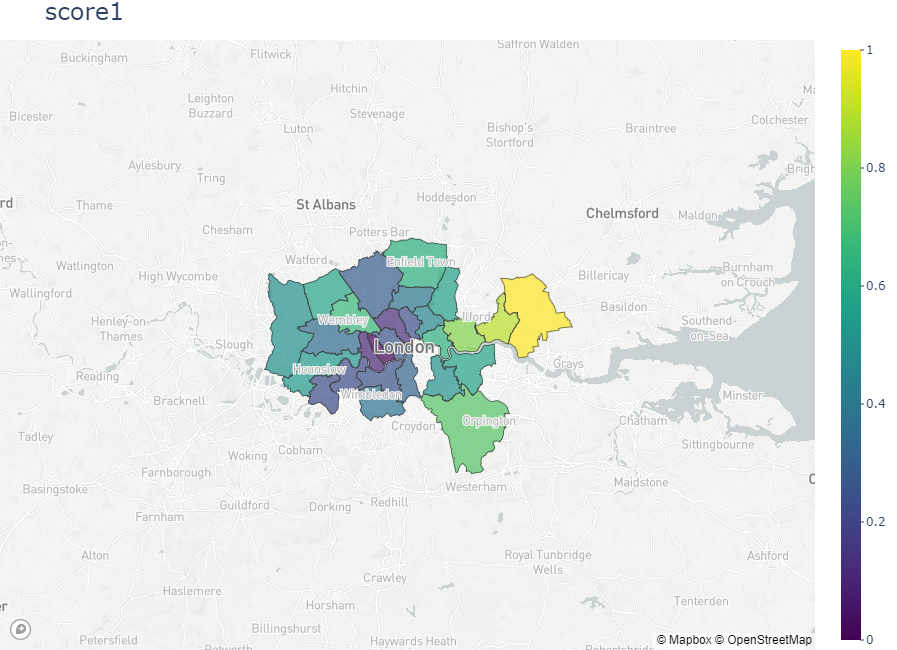

In [70]:
plot_london('score1', merged_borough)

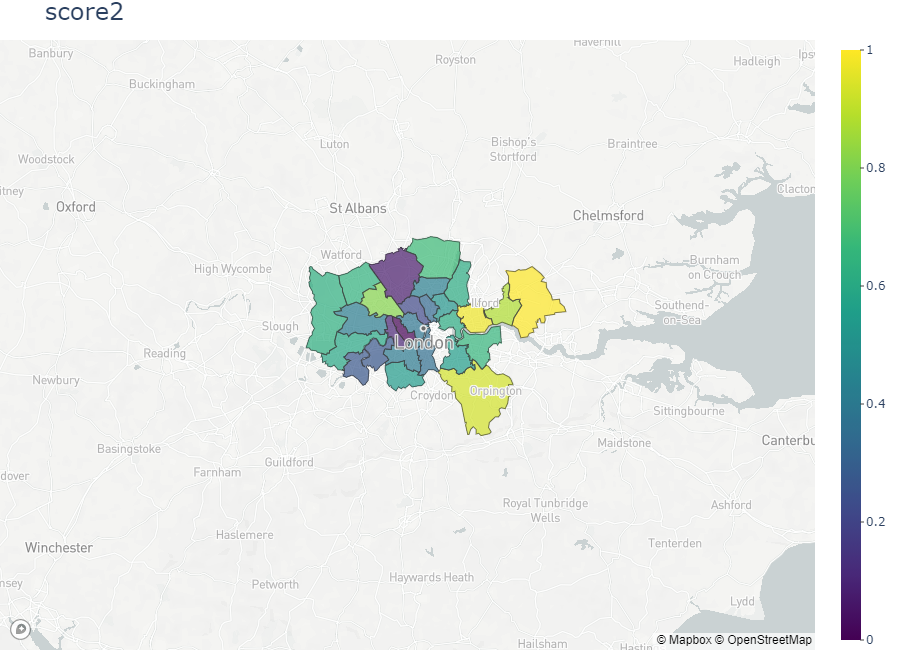

In [71]:
plot_london('score2', merged_borough)

### Validation of the computed scores

In [73]:
merged_borough[['f_obese', 'score1', 'score2']].corr(method='spearman')

,f_obese,score1,score2
f_obese,1.000000,0.650821,0.669973
score1,0.650821,1.000000,0.963761
score2,0.669973,0.963761,1.000000


In [85]:
features = ['score1', 'score2']
weights = find_weights(merged_borough, 'f_obese')
weights

0.1 0.1
f_obese
Training error : 11.772057788034935, R2 : 0.45773361293879133


array([2.4129978 , 0.73104536])

Demain: fitter les deux scores sur tous les datasets d'obésité, valider sur le diabète